<a href="https://colab.research.google.com/github/DifferentiableUniverseInitiative/Baryonator/blob/main/notebooks/DMO_to_Hydro_with_ML_test_on_CAMELS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget -O snap_030.hdf5 https://users.flatironinstitute.org/~camels/Sims/IllustrisTNG/CV_0/snap_030.hdf5
!wget -O dm_snap_030.hdf5 https://users.flatironinstitute.org/~camels/Sims/IllustrisTNG_DM/CV_0/snap_030.hdf5

--2023-05-15 20:08:35--  https://users.flatironinstitute.org/~camels/Sims/IllustrisTNG/CV_0/snap_030.hdf5
Resolving users.flatironinstitute.org (users.flatironinstitute.org)... 144.121.86.9
Connecting to users.flatironinstitute.org (users.flatironinstitute.org)|144.121.86.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2647279724 (2.5G) [application/octet-stream]
Saving to: ‘snap_030.hdf5’

snap_030.hdf5       100%[===================>]   2.46G  96.5MB/s    in 28s     

2023-05-15 20:09:02 (91.7 MB/s) - ‘snap_030.hdf5’ saved [2647279724/2647279724]

--2023-05-15 20:09:02--  https://users.flatironinstitute.org/~camels/Sims/IllustrisTNG_DM/CV_0/snap_030.hdf5
Resolving users.flatironinstitute.org (users.flatironinstitute.org)... 144.121.86.9
Connecting to users.flatironinstitute.org (users.flatironinstitute.org)|144.121.86.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 207063383 (197M) [application/octet-stream]
Saving to: ‘dm_snap_

In [2]:
!pip install --quiet git+https://github.com/DifferentiableUniverseInitiative/JaxPM.git
!pip install --quiet optax tqdm hdf5plugin

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.4/287.4 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.8/39.8 MB 17.8 MB/s eta 0:00:00


In [3]:
%pylab inline
import jax
import jax.numpy as jnp

import h5py
import hdf5plugin

from jaxpm.painting import cic_paint, cic_read, compensate_cic
from jaxpm.utils import power_spectrum
from jaxpm.utils import _initialize_pk
from jaxpm.pm import linear_field, lpt, make_ode_fn, pm_forces
from jaxpm.kernels import fftk, gradient_kernel, laplace_kernel, longrange_kernel

Populating the interactive namespace from numpy and matplotlib


In [4]:
#@title [Run Me]

import jax.lax as lax 

def cross_correlation(field1, field2, kmin=5, dk=0.5, boxsize=False):
  shape = field1.shape
  nx, ny, nz = shape

  #initialze values related to powerspectra (mode bins and weights)
  dig, Nsum, xsum, W, k, kedges = _initialize_pk(shape, boxsize, kmin, dk)

  #fast fourier transform
  fft_image1 = jnp.fft.fftn(field1)
  fft_image2 = jnp.fft.fftn(field2)

  #absolute value of fast fourier transform
  pk = jnp.real(fft_image1 * jnp.conj(fft_image2))

  #calculating powerspectra
  real = jnp.real(pk).reshape([-1])
  imag = jnp.imag(pk).reshape([-1])

  Psum = jnp.bincount(dig, weights=(W.flatten() * imag), length=xsum.size) * 1j
  Psum += jnp.bincount(dig, weights=(W.flatten() * real), length=xsum.size)

  P = ((Psum / Nsum)[1:-1] * boxsize.prod()).astype('float32')

  #normalization for powerspectra
  norm = np.prod(np.array(shape[:])).astype('float32')**2

  #find central values of each bin
  kbins = kedges[:-1] + (kedges[1:] - kedges[:-1]) / 2

  return kbins, P / norm


def gaussian_kernel(kvec, k_smooth):
  """
  Computes a gaussian kernel
  """
  kk = sum(ki**2 for ki in kvec)
  return jnp.exp(-0.5 * kk / k_smooth**2)

In [5]:
# This will define the mesh size we use to make 3d density maps 
# Note that the physical size of the volume is 25 Mpc/h on the side
# so one voxel is 25/128 Mpc/h on the side
mesh_shape = [128,128,128]

## Loading the snapshots

In [6]:
# First, the full hydro run
data         = h5py.File('snap_030.hdf5', 'r')
BoxSize      = data['Header'].attrs[u'BoxSize']/1e3    #size of the snapshot in comoving Mpc/h
redshift     = data['Header'].attrs[u'Redshift']       #reshift of the snapshot
scale_factor = data['Header'].attrs[u'Time']           #scale factor
h            = data['Header'].attrs[u'HubbleParam']    #value of the hubble parameter in 100 km/s/(Mpc/h)
Masses       = data['Header'].attrs[u'MassTable']*1e10 #masses of the particles in Msun/h
Np           = data['Header'].attrs[u'NumPart_Total']  #total number of particles for specie
Omega_m      = data['Header'].attrs[u'Omega0']
Omega_L      = data['Header'].attrs[u'OmegaLambda']
Omega_b      = data['Header'].attrs[u'OmegaBaryon']

# Loading the DM particles
hydro_dm_pos = data['PartType1/Coordinates'][:]/1e3  #Mpc/h
hydro_dm_pos = (hydro_dm_pos/BoxSize*mesh_shape[0])   #Rescaling positions to grid coordinates

# Loading the gas particles
hydro_gas_pos  = data['PartType0/Coordinates'][:]/1e3 #Mpc/h
hydro_gas_pos = (hydro_gas_pos/BoxSize*mesh_shape[0]) #Rescaling positions to grid coordinates
hydro_gas_mass = data['PartType0/Masses'][:]*1e10     #Msun/h 
hydro_gas_rho = data['/PartType0/Density'][:]*1e10 * (1e3)**3 #(Msun/h)/(Mpc/h)^3
hydro_gas_U   = data['/PartType0/InternalEnergy'][:]  #(km/s)^2
hydro_gas_ne  = data['/PartType0/ElectronAbundance'][:]
# Derive pressure
gamma = 5.0/3.0
hydro_gas_P = (gamma-1.0)*hydro_gas_U*hydro_gas_rho #units are (Msun/h)*(km/s)^2/(Mpc/h)^3
# And temperature
yhelium = 0.0789
BOLTZMANN  = 1.38065e-16         #erg/K - NIST 2010
PROTONMASS = 1.67262178e-24      #gram  - NIST 2010
hydro_gas_T = hydro_gas_U*(1.0 + 4.0*yhelium)/(1.0 + yhelium + hydro_gas_ne)*1e10*(2.0/3.0)
hydro_gas_T *= (PROTONMASS/BOLTZMANN)
data.close()
# Utility functions from the CAMELS library https://github.com/franciscovillaescusa/CAMELS/blob/master/library/camels_library.py


In [7]:
# Same thing for the DMO run
data         = h5py.File('dm_snap_030.hdf5', 'r')

# Loading the DM particles
dmo_dm_pos  = data['PartType1/Coordinates'][:]/1e3  # Mpc/h
dmo_dm_pos = (dmo_dm_pos/BoxSize*mesh_shape[0])   # Rescaling positions to grid coordinates

In [8]:
# Our input quantities are only what we can see in the DMO simulation,
# but we will use these quantities to map onto the hydro fields
# Computing total rho and fscalar
dmo_rho = cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos)

# And compute the scalar force 
kvec = fftk(mesh_shape)
dmo_delta_k = jnp.fft.rfftn(dmo_rho)
kk = sum(ki**2 for ki in kvec)
kk[kk == 0] = 1.
dmo_delta_k = dmo_delta_k / jnp.sqrt(kk)

dmo_dm_rho = cic_read(dmo_rho, dmo_dm_pos)
dmo_dm_fscalar = cic_read(jnp.fft.irfftn(dmo_delta_k), dmo_dm_pos)

<ipython-input-8-3af7420bfd2a>:9: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  kk = sum(ki**2 for ki in kvec)


In [9]:
# Then, in the hydro, we need the dm and gas density, sampled at the DMO position
hydrop_dm_rho = cic_read(cic_paint(jnp.zeros(mesh_shape), hydro_dm_pos), dmo_dm_pos)
hydrop_gas_rho = cic_read(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, weight=hydro_gas_mass/Masses[1]), dmo_dm_pos)
hydrop_gas_P = cic_read(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_P/hydro_gas_rho), dmo_dm_pos)
hydrop_gas_T = cic_read(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_T/hydro_gas_rho), dmo_dm_pos)

Ok, so the questions that I'm curious about is to see whether the information about fscalar and rho is enough to predict the gas pressure and temperature, in principle.

## Testing correspondance between local environment and P/T/density

In [10]:
!pip --quiet install flax optax

In [11]:
%load_ext tensorboard
import jax
import jax.numpy as jnp
import tqdm
import optax
import flax.linen as nn
from flax.metrics import tensorboard

In [12]:
from sklearn.preprocessing import StandardScaler

# Assembling the data
data = jnp.stack([log10(dmo_dm_rho),np.arcsinh(dmo_dm_fscalar/100), 
                  log10(hydrop_gas_P), log10(hydrop_gas_T), 
                  log10(hydrop_dm_rho/dmo_dm_rho), log10(hydrop_gas_rho/dmo_dm_rho)], axis=-1)
data_scaler = StandardScaler()
output_scaler = StandardScaler()
output_scaler = output_scaler.fit(data[:,2:])
data = data_scaler.fit_transform(data)

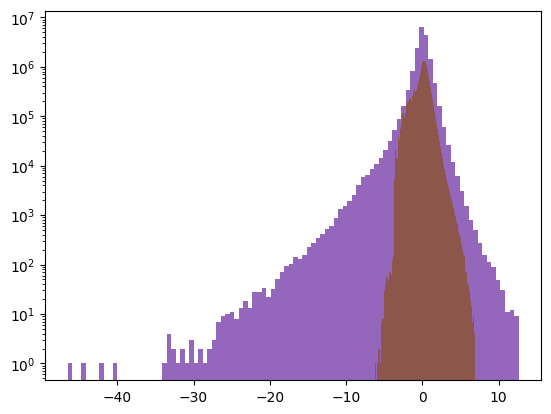

In [13]:
for i in range(6):
  hist(np.array(data[:,i]),100)

yscale('log')

In [14]:
class HydroModel(nn.Module):
  @nn.compact
  def __call__(self, x):
    net = nn.leaky_relu(nn.Dense(512)(x))
    net = nn.leaky_relu(nn.Dense(512)(net))
    net = nn.leaky_relu(nn.Dense(512)(net))
    net = nn.leaky_relu(nn.Dense(512)(net))
    return nn.Dense(4)(net)

In [15]:
# Random seed for sampling from posterior
seed = jax.random.PRNGKey(0)

# Let's instantiate and initialize the model
model = HydroModel()
params = model.init(jax.random.PRNGKey(42), jnp.zeros(shape=[1, 2]))

# Define a scheduler for the leaerning rate
total_steps = 50_000
lr_scheduler = optax.piecewise_constant_schedule(init_value=0.001,
                  boundaries_and_scales={int(total_steps*0.3):0.2,
                                         int(total_steps*0.6):0.1,})

# Initializes an optimizer and optimizer state
optimizer = optax.adam(learning_rate=lr_scheduler)
opt_state = optimizer.init(params)

summary_writer = tensorboard.SummaryWriter('logs/mse_test')

In [16]:
# Define a simple MSE regression loss 
def loss_fn(params, batch):
    return jnp.mean(jnp.sum((model.apply(params, batch['x']) - batch['y'])**2,axis=-1))

@jax.jit
def update_model(params,  opt_state, batch):
  # Computes the gradients of the model
  loss, grads = jax.value_and_grad(loss_fn)(params, batch)

  # Computes the weights updates and apply them
  updates, opt_state = optimizer.update(grads, opt_state)
  params = optax.apply_updates(params, updates)

  return params, opt_state, loss

In [17]:
%tensorboard --logdir=.

<IPython.core.display.Javascript object>

In [18]:
for i in tqdm.tqdm(range(total_steps)):
  inds = choice(len(data), 1024)
  batch = {'x': data[inds,0:2], 'y': jnp.clip(data[inds,2:],-10,10)}
  
  # Apply the update function
  params, opt_state, loss = update_model(params, opt_state, batch)
  # Periodically exporting the value of the loss function, every 100 steps
  if i %100 ==0:
     summary_writer.scalar('train_loss', loss, i)
     summary_writer.scalar('learning_rate', lr_scheduler(i), i)

100%|██████████| 50000/50000 [01:26<00:00, 578.17it/s]


In [19]:
# Let's test on the remaining examples
inds = choice(len(data), 50000)
x_test = data[inds,0:2]
y_test = data[inds,2:]
pred = model.apply(params, x_test)

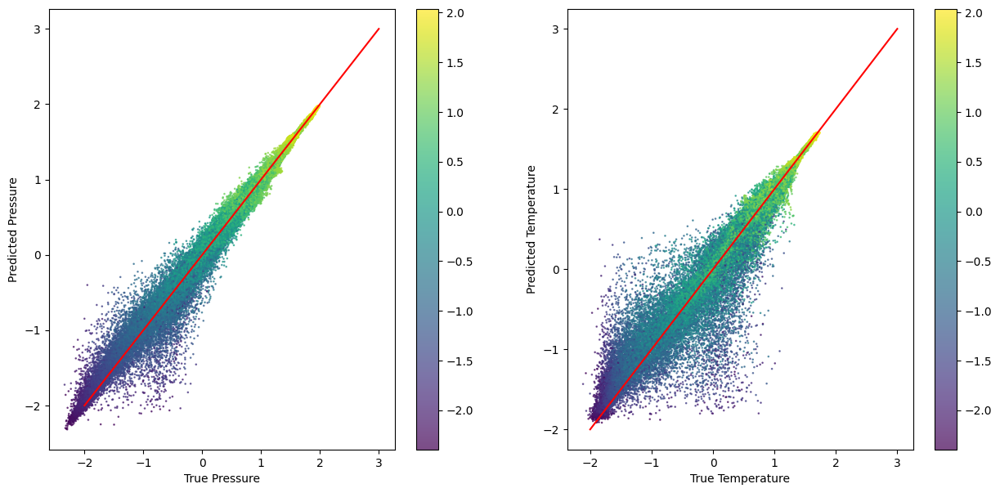

In [20]:
figure(figsize=[15,7])
subplot(121)
scatter(y_test[:,0], pred[:,0], c=x_test[:,0], s=0.75,alpha=0.7); colorbar()
xlabel('True Pressure'); ylabel('Predicted Pressure')
plot([-2,3],[-2,3],color='r')
subplot(122)
scatter(y_test[:,1], pred[:,1], c=x_test[:,0], s=0.75,alpha=0.7); colorbar()
xlabel('True Temperature'); ylabel('Predicted Temperature')
plot([-2,3],[-2,3],color='r')

(-2.5, 3.0)

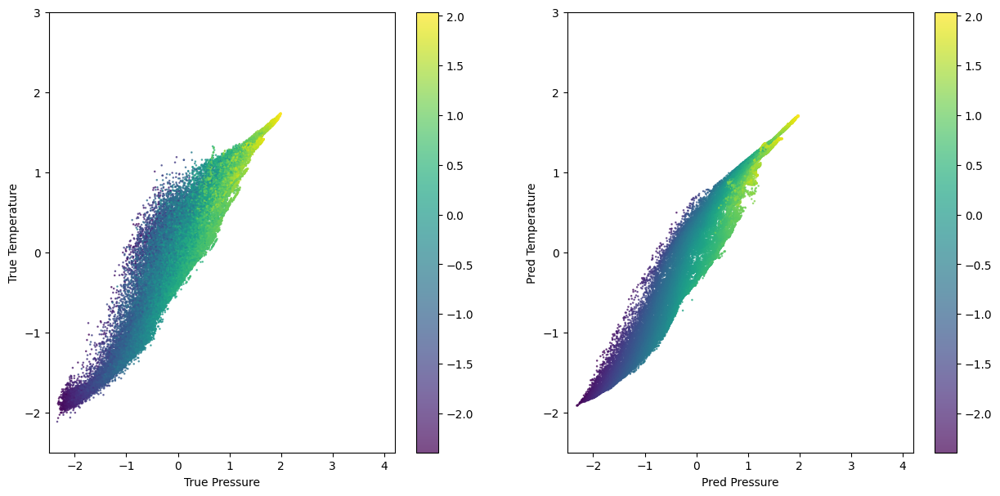

In [21]:
figure(figsize=[15,7])
subplot(121)
scatter(y_test[:,0], y_test[:,1], c=x_test[:,0], s=0.75,alpha=0.7); colorbar()
# scatter(pred[:,0], pred[:,1], c='red', s=0.75,alpha=0.7);
xlabel('True Pressure'); ylabel('True Temperature')
xlim(-2.5, 4.2)
ylim(-2.5, 3)
subplot(122)
scatter(pred[:,0], pred[:,1], c=x_test[:,0], s=0.75,alpha=0.7); colorbar()
xlabel('Pred Pressure'); ylabel('Pred Temperature')
xlim(-2.5, 4.2)
ylim(-2.5, 3)

Text(0, 0.5, 'fscalar')

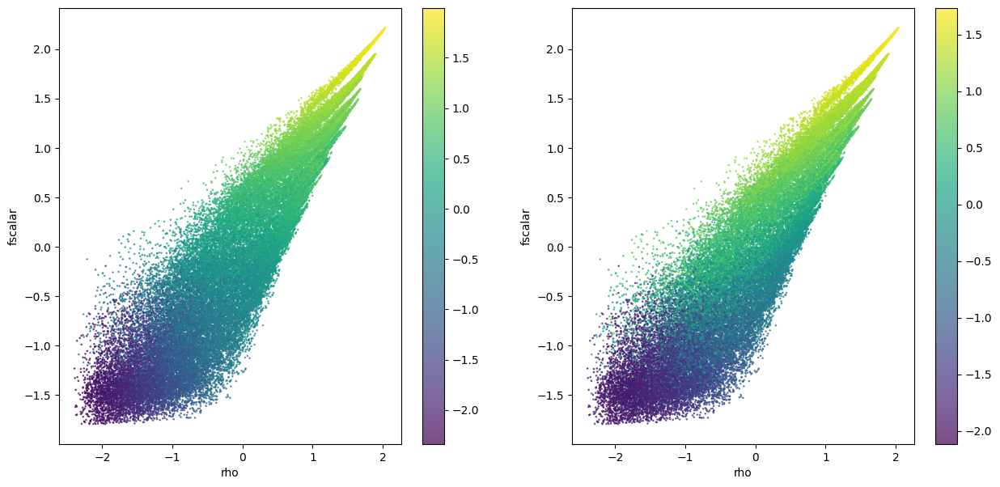

In [22]:
figure(figsize=[15,7])
subplot(121)
scatter(x_test[:,0], x_test[:,1], c=y_test[:,0], s=0.75,alpha=0.7); colorbar()
# scatter(pred[:,0], pred[:,1], c='red', s=0.75,alpha=0.7);
xlabel('rho'); ylabel('fscalar')
subplot(122)
scatter(x_test[:,0], x_test[:,1], c=y_test[:,1], s=0.75,alpha=0.7); colorbar()
xlabel('rho'); ylabel('fscalar')

Text(0, 0.5, 'fscalar')

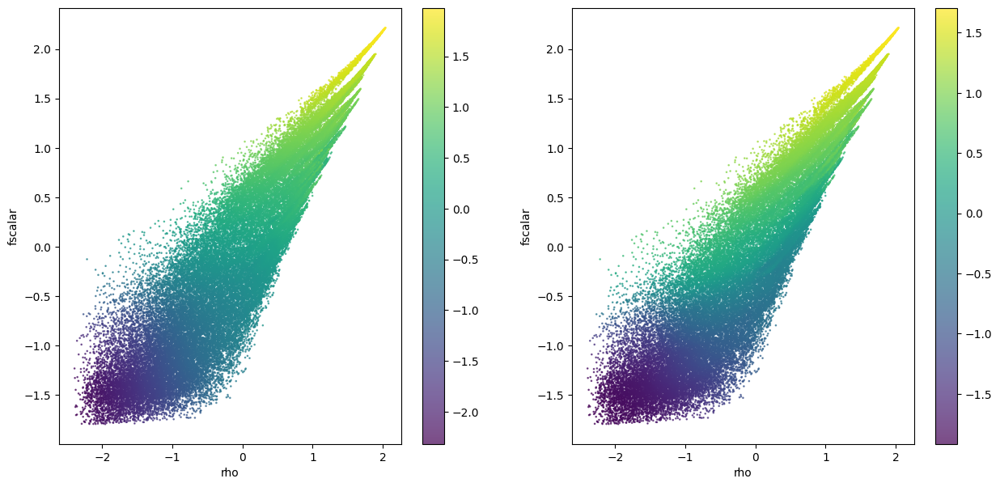

In [23]:
figure(figsize=[15,7])
subplot(121)
scatter(x_test[:,0], x_test[:,1], c=pred[:,0], s=0.75,alpha=0.7); colorbar()
# scatter(pred[:,0], pred[:,1], c='red', s=0.75,alpha=0.7);
xlabel('rho'); ylabel('fscalar')
subplot(122)
scatter(x_test[:,0], x_test[:,1], c=pred[:,1], s=0.75,alpha=0.7); colorbar()
xlabel('rho'); ylabel('fscalar')

Text(0, 0.5, 'fscalar')

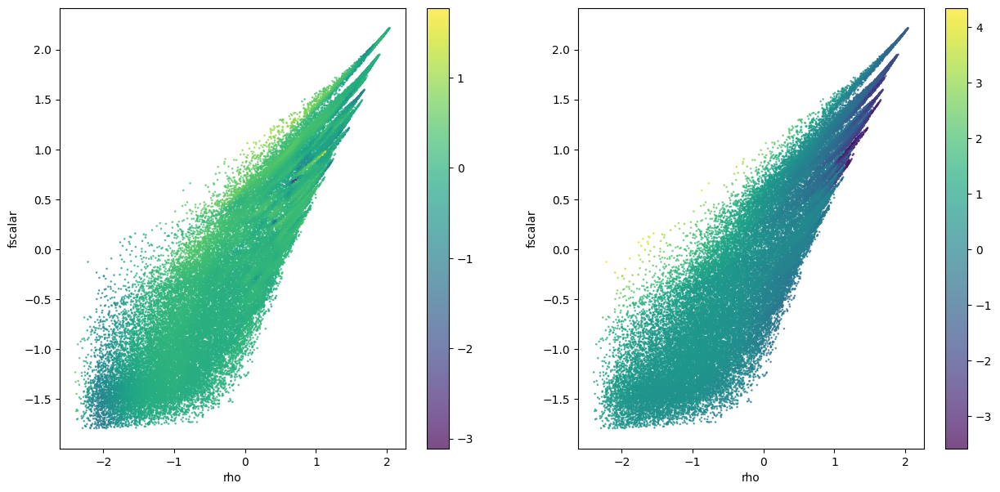

In [24]:
figure(figsize=[15,7])
subplot(121)
scatter(x_test[:,0], x_test[:,1], c=pred[:,2], s=0.75,alpha=0.7); colorbar()
# scatter(pred[:,0], pred[:,1], c='red', s=0.75,alpha=0.7);
xlabel('rho'); ylabel('fscalar')
subplot(122)
scatter(x_test[:,0], x_test[:,1], c=pred[:,3], s=0.75,alpha=0.7); colorbar()
xlabel('rho'); ylabel('fscalar')

In [25]:
# So, what happens if we try to make maps from this relation instead of the true one
preds = []
for i in tqdm.tqdm(range(len(data)//10000)):
  preds.append(model.apply(params, data[i*10000:(i+1)*10000,0:2]))
preds.append(model.apply(params, data[(i+1)*10000:,0:2]))
preds = jnp.concatenate(preds, axis=0)

100%|██████████| 1677/1677 [01:04<00:00, 25.87it/s]


In [26]:
# Inverting the normalisation
preds = output_scaler.inverse_transform(preds)

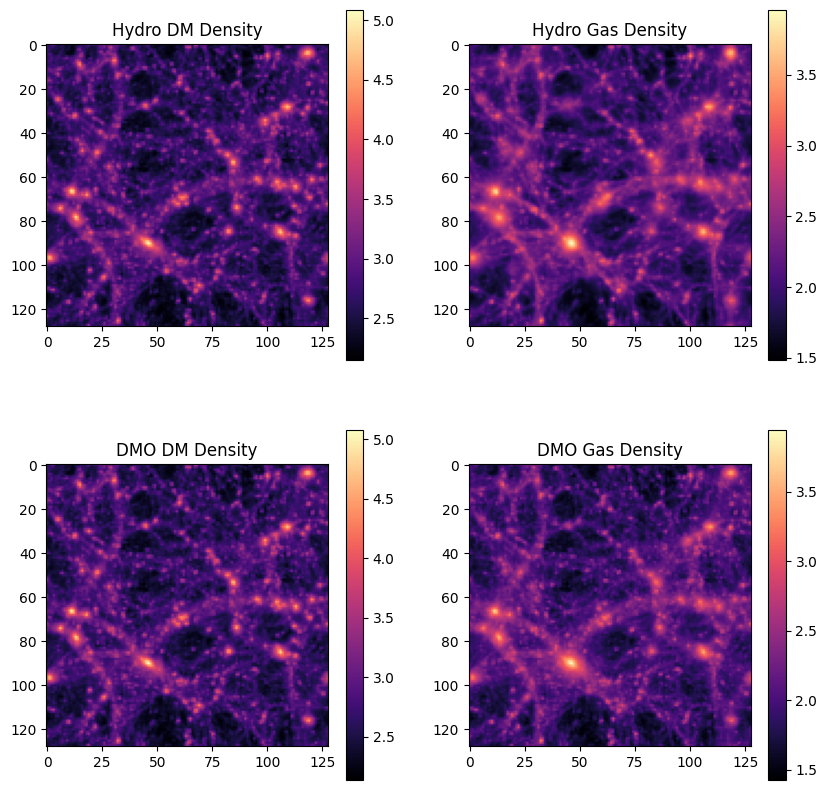

In [27]:
# Generating the gas and dm density in the DMO
figure(figsize=(10,10))
subplot(221)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_dm_pos).sum(axis=0)), cmap='magma'); colorbar()
title('Hydro DM Density');
subplot(222)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_mass/Masses[1]).sum(axis=0)), cmap='magma'); colorbar()
title('Hydro Gas Density');
subplot(223)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos).sum(axis=0)), cmap='magma'); colorbar()
title('DMO DM Density');
subplot(224)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos, 10**preds[:,3]).sum(axis=0)), cmap='magma'); colorbar()
title('DMO Gas Density');

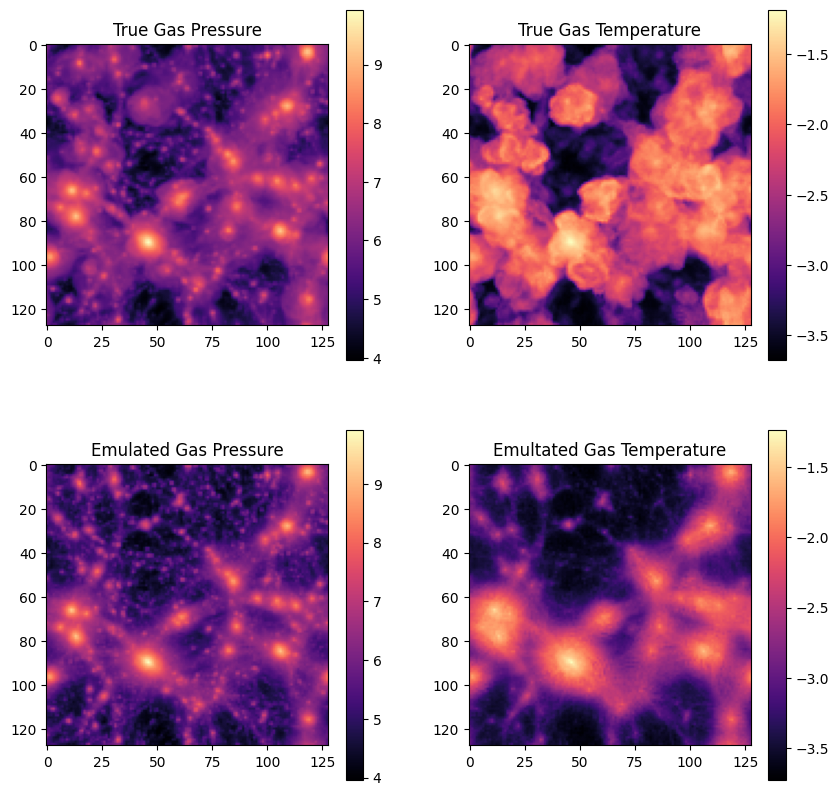

In [28]:
figure(figsize=[10,10])
subplot(221)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_P/hydro_gas_rho).sum(axis=0)), cmap='magma'); colorbar()
title('True Gas Pressure');
subplot(222)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_T/hydro_gas_rho).sum(axis=0)), cmap='magma'); colorbar()
title('True Gas Temperature');
subplot(223)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos, 10**preds[:,0]/dmo_dm_rho).sum(axis=0)), cmap='magma'); colorbar()
title('Emulated Gas Pressure');
subplot(224)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos, 10**preds[:,1]/dmo_dm_rho).sum(axis=0)), cmap='magma'); colorbar()
title('Emultated Gas Temperature');

In [46]:
# Let's try to do compton Y
sigT  = 6.65e-29 # m^2
me    = 9.11e-31 # kg
c     = 3e8      # m^2/s^2
dl    = 25/128   # Mpc/h
h     = 0.6777

#  Compton-y for CAMELS
y     = np.sum(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_P/hydro_gas_rho),axis=2)*dl   # [h Msun (km/s)^2/Mpc^2]
# y     = y*sigT/(3.0886e22)**2          # [h Msun (km/s)^2/Mpc^2] -> [h Msun (km/s)^2 ]
# y     = y/me*1.99e30                   # [h Msun (km/s)^2 ]      -> [h (km/s)^2 ]
# y     = y*(1000)**2/c**2*h             # [h (km/s)^2 ]           -> unitless

#  Compton-y for fscalar
yf    = np.sum(cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos, 10**preds[:,0]/dmo_dm_rho),axis=2)*dl    # [h Msun (km/s)^2/Mpc^2]
# yf    = yf*sigT/(3.0886e22)**2         # [h Msun (km/s)^2/Mpc^2] -> [h Msun (km/s)^2 ]
# yf    = yf/me*1.99e30                  # [h Msun (km/s)^2 ]      -> [h (km/s)^2 ]
# yf    = yf*(1000)**2/c**2*h            # [h (km/s)^2 ]           -> unitless



<Figure size 640x480 with 0 Axes>

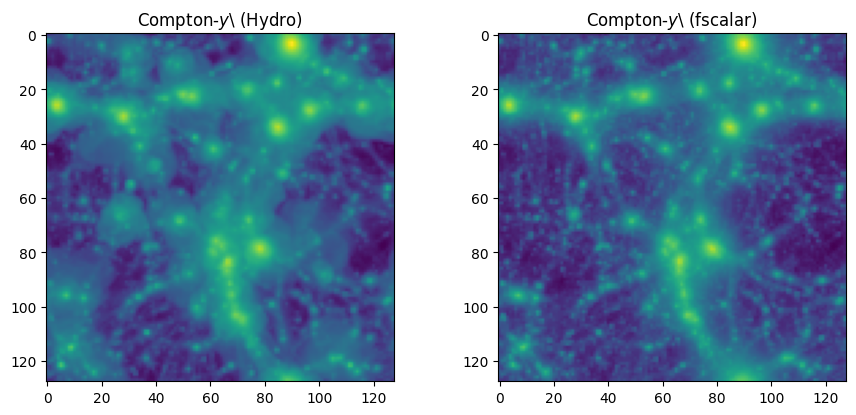

In [47]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter as gf
plt.clf()
fig = plt.figure(figsize=(8,4))
gs  = gridspec.GridSpec(1, 2,
                       top=0.95,
                       right=1.00,
                       left=0.00,
                       bottom=0.00,
                        hspace=0.2,
                        wspace=0.3
                       )


ax0 = plt.subplot(gs[0])
ax1 = plt.subplot(gs[1])

p0=ax0.imshow(np.log10(y))
ax0.set_title(r"${\rm Compton}$-$y$\ ${\rm (Hydro)}$")
ax0.grid(False)

p1=ax1.imshow(np.log10(yf))
ax1.set_title(r"${\rm Compton}$-$y$\ ${\rm (fscalar)}$")
ax1.grid(False)
plt.grid(False)

In [29]:
# On the hydro side, let's add both DM and baryons
total_delta_hydro = cic_paint(jnp.zeros(mesh_shape), hydro_dm_pos)
total_delta_hydro = cic_paint(total_delta_hydro, hydro_gas_pos, 
                                weight=hydro_gas_mass/Masses[1])
total_delta_hydro = total_delta_hydro/total_delta_hydro.mean() - 1

dm_delta_hydro = cic_paint(jnp.zeros(mesh_shape), hydro_dm_pos)
dm_delta_hydro = dm_delta_hydro/dm_delta_hydro.mean() - 1

gas_delta_hydro = cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, 
                                weight=hydro_gas_mass/Masses[1])
gas_delta_hydro = gas_delta_hydro/gas_delta_hydro.mean() - 1

In [30]:
# On the DMO side, we only grab the dark matter
total_delta_dmo = cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos)
total_delta_dmo = total_delta_dmo/total_delta_dmo.mean() - 1

In [31]:
# Let's compute the power spectra
k, pk_hydro = power_spectrum(
      compensate_cic(total_delta_hydro),
      boxsize=np.array([25.] * 3),
      kmin=np.pi / 25.,
      dk=2 * np.pi / 25.)

_, pk_hydro_gas = power_spectrum(
      compensate_cic(gas_delta_hydro),
      boxsize=np.array([25.] * 3),
      kmin=np.pi / 25.,
      dk=2 * np.pi / 25.)

_, pk_hydro_dm = power_spectrum(
      compensate_cic(dm_delta_hydro),
      boxsize=np.array([25.] * 3),
      kmin=np.pi / 25.,
      dk=2 * np.pi / 25.)

_, pk_dmo = power_spectrum(
      compensate_cic(total_delta_dmo),
      boxsize=np.array([25.] * 3),
      kmin=np.pi / 25.,
      dk=2 * np.pi / 25.)

_,xpk=cross_correlation(compensate_cic(total_delta_hydro), compensate_cic(total_delta_dmo),
      boxsize=np.array([25.] * 3),
      kmin=np.pi / 25.,
      dk=2 * np.pi / 25.)

/usr/local/lib/python3.10/dist-packages/jax/_src/lax/lax.py:501: ComplexWarning: Casting complex values to real discards the imaginary part
  return _convert_element_type(operand, new_dtype, weak_type=False)


Text(0, 0.5, '$P(k)$')

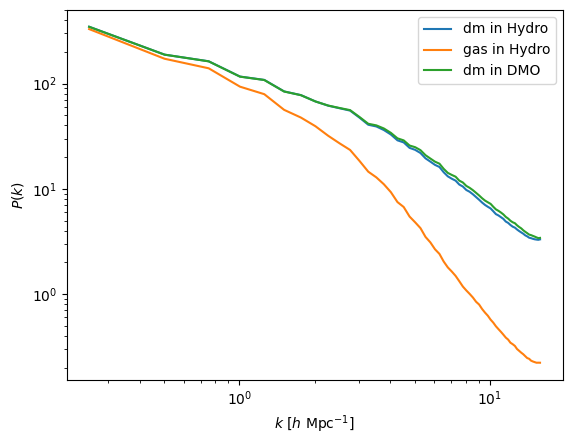

In [32]:
loglog(k,pk_hydro_dm, label='dm in Hydro')
loglog(k,pk_hydro_gas, label='gas in Hydro')
loglog(k,pk_dmo, label='dm in DMO')
legend()
plt.xlabel(r"$k$ [$h \ \mathrm{Mpc}^{-1}$]")
plt.ylabel(r"$P(k)$")

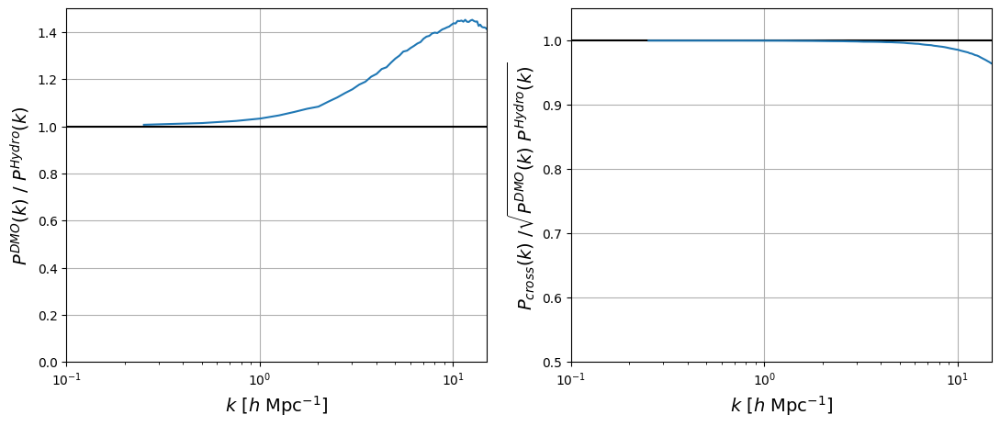

In [33]:
figure(figsize=[13,5])
subplot(121)
axhline(1., color='black')
semilogx(k, (pk_dmo/pk_hydro))   
ylabel(r"$ P^{DMO}(k) \ / \ P^{Hydro}(k)$",fontsize=14)
xlabel(r"$k$ [$h \ \mathrm{Mpc}^{-1}$]",fontsize=14)
ylim(0.,1.5)
xlim(0.1, 15)
plt.grid(True)

subplot(122)

axhline(1., color='black')
semilogx(k, xpk/(jnp.sqrt(pk_dmo)*jnp.sqrt(pk_hydro)))
grid()
xlabel(r"$k$ [$h \ \mathrm{Mpc}^{-1}$]",fontsize=14)
ylabel(r"$ P_{cross}(k) \ / \sqrt{ P^{DMO}(k) \ P^{Hydro}(k)}$",fontsize=14);
ylim(0.5,1.05);
xlim(0.1, 15);

In [34]:
# Let's look at the result
# On the DMO side, we only grab the dark matter
total_delta_ml = cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos, 10**preds[:,2]) # This is the DM
total_delta_ml = cic_paint(total_delta_ml, dmo_dm_pos, 10**preds[:,3]) # This is the gas
total_delta_ml = total_delta_ml/total_delta_ml.mean() - 1

dm_delta_ml = cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos, 10**preds[:,2]) # This is the DM
dm_delta_ml = dm_delta_ml/dm_delta_ml.mean() - 1

gas_delta_ml = cic_paint(jnp.zeros(mesh_shape), dmo_dm_pos, 10**preds[:,3]) # This is the gas
gas_delta_ml = gas_delta_ml/gas_delta_ml.mean() - 1

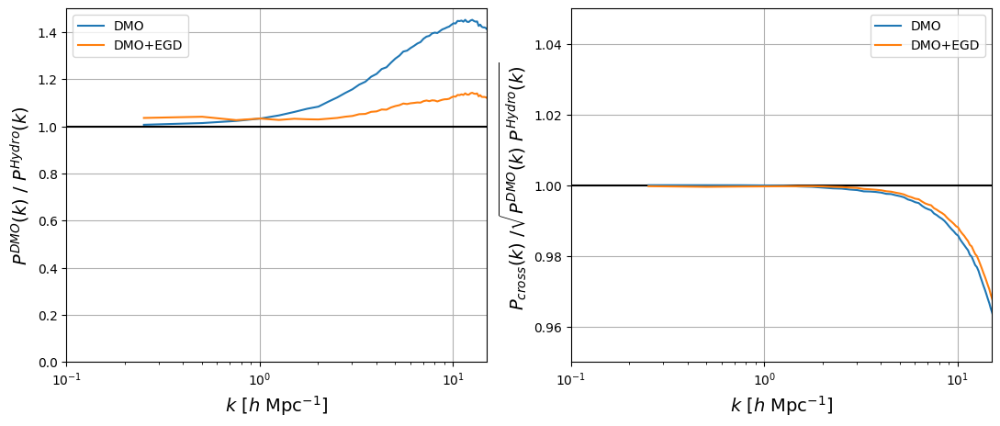

In [35]:
# Now let's compute 2pt stats
_, pk_egd = power_spectrum(
      compensate_cic(total_delta_ml),
      boxsize=np.array([25.] * 3),
      kmin=np.pi / 25.,
      dk=2 * np.pi / 25.)

_, pk_egd_gas = power_spectrum(
      compensate_cic(gas_delta_ml),
      boxsize=np.array([25.] * 3),
      kmin=np.pi / 25.,
      dk=2 * np.pi / 25.)


_, pk_egd_dm = power_spectrum(
      compensate_cic(dm_delta_ml),
      boxsize=np.array([25.] * 3),
      kmin=np.pi / 25.,
      dk=2 * np.pi / 25.)

_,xpk_egd=cross_correlation(compensate_cic(total_delta_hydro), compensate_cic(total_delta_ml),
      boxsize=np.array([25.] * 3),
      kmin=np.pi / 25.,
      dk=2 * np.pi / 25.)

figure(figsize=[13,5])
subplot(121)
axhline(1., color='black')
semilogx(k, (pk_dmo/pk_hydro), label='DMO')   
semilogx(k, (pk_egd/pk_hydro), label='DMO+EGD')   
ylabel(r"$ P^{DMO}(k) \ / \ P^{Hydro}(k)$",fontsize=14)
xlabel(r"$k$ [$h \ \mathrm{Mpc}^{-1}$]",fontsize=14)
ylim(0.,1.5)
xlim(0.1, 15)
legend()
plt.grid(True)

subplot(122)

axhline(1., color='black')
semilogx(k, xpk/(jnp.sqrt(pk_dmo)*jnp.sqrt(pk_hydro)), label='DMO')
semilogx(k, xpk_egd/(jnp.sqrt(pk_egd)*jnp.sqrt(pk_hydro)), label='DMO+EGD')
grid()
xlabel(r"$k$ [$h \ \mathrm{Mpc}^{-1}$]",fontsize=14)
ylabel(r"$ P_{cross}(k) \ / \sqrt{ P^{DMO}(k) \ P^{Hydro}(k)}$",fontsize=14);
ylim(0.95,1.05);
xlim(0.1, 15);
legend()

Text(0, 0.5, '$P(k)$')

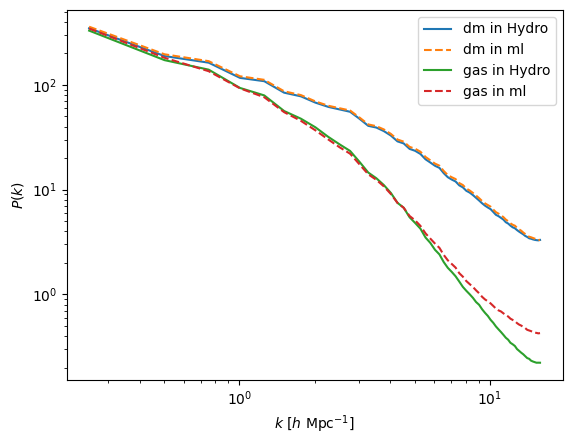

In [36]:
loglog(k,pk_hydro_dm, label='dm in Hydro')
loglog(k,pk_egd_dm, '--', label='dm in ml')

loglog(k,pk_hydro_gas, label='gas in Hydro')
loglog(k,pk_egd_gas, '--', label='gas in ml')

# loglog(k,pk_dmo, label='dm in DMO')
legend()
plt.xlabel(r"$k$ [$h \ \mathrm{Mpc}^{-1}$]")
plt.ylabel(r"$P(k)$")

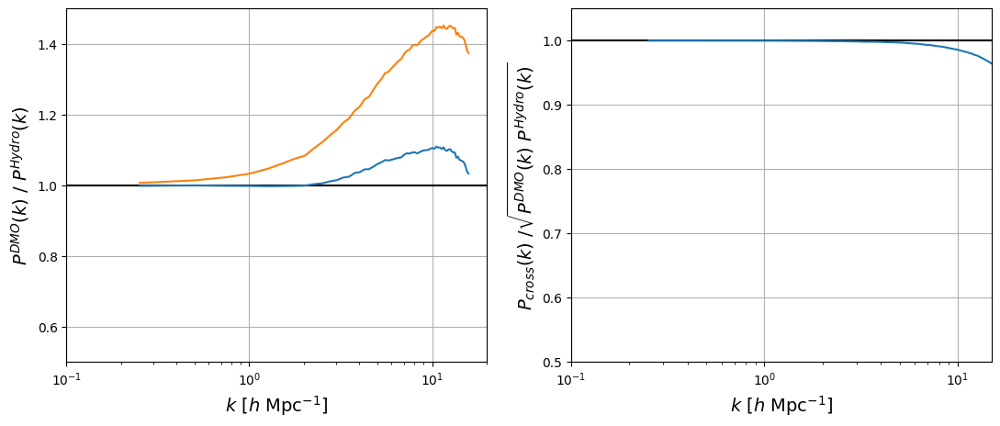

In [37]:
figure(figsize=[13,5])
subplot(121)
axhline(1., color='black')
semilogx(k, (pk_dmo/pk_hydro_dm), label='DM')
semilogx(k, (pk_dmo/pk_hydro), label='DM')
# semilogx(k, (pk_egd_dm/pk_hydro_dm), label='DM')
# semilogx(k, (pk_egd_gas/pk_hydro_gas), label='Gas')

ylabel(r"$ P^{DMO}(k) \ / \ P^{Hydro}(k)$",fontsize=14)
xlabel(r"$k$ [$h \ \mathrm{Mpc}^{-1}$]",fontsize=14)
ylim(0.5,1.5)
xlim(0.1, 20)
plt.grid(True)

subplot(122)

axhline(1., color='black')
semilogx(k, xpk/(jnp.sqrt(pk_dmo)*jnp.sqrt(pk_hydro)))
grid()
xlabel(r"$k$ [$h \ \mathrm{Mpc}^{-1}$]",fontsize=14)
ylabel(r"$ P_{cross}(k) \ / \sqrt{ P^{DMO}(k) \ P^{Hydro}(k)}$",fontsize=14);
ylim(0.5,1.05);
xlim(0.1, 15);

In [ ]:
# Let's try to identify the regions that are problematic
mask = (data[:,2] > 0. ) & (data[:,3] < -0.5 )

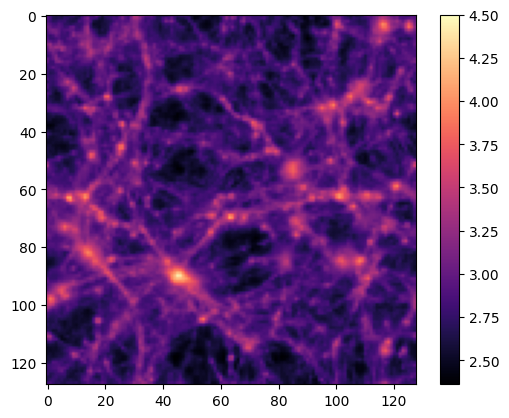

In [ ]:
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos[~mask]).sum(axis=0)), cmap='magma',vmax=4.5); colorbar()

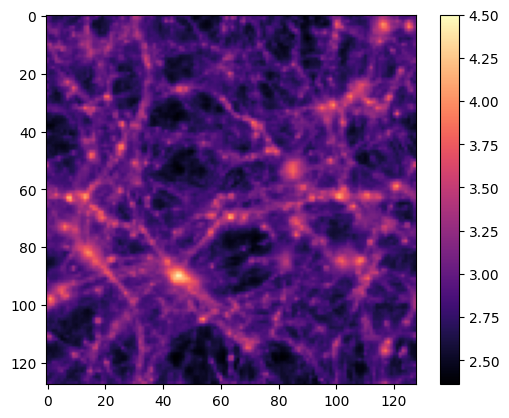

In [ ]:
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos).sum(axis=0)), cmap='magma',vmax=4.5); colorbar()

## Now trying to model this table probabilistically

In [ ]:
import jax
import jax.numpy as jnp
import tensorflow_probability as tfp; tfp = tfp.substrates.jax
tfd = tfp.distributions
tfb = tfp.bijectors


def make_nvp_fn(condition, n_layers=5, d=2):

  class AffineCoupling(nn.Module):
    
    @nn.compact
    def __call__(self, x, nunits):
      x = jnp.concatenate([x, condition], axis=-1)
      net = nn.leaky_relu(nn.Dense(256)(x))
      net = nn.leaky_relu(nn.Dense(256)(net))

      # Shift and scale parameters
      shift = nn.Dense(nunits)(net)
      scale = nn.softplus(nn.Dense(nunits)(net)) + 1e-3 # For numerical stability

      return  tfb.Chain([ tfb.Shift(shift), tfb.Scale(scale)])


  # We alternate between permutations and flow layers
  layers = [ tfb.Permute([1,0])(tfb.RealNVP(d//2, 
                                            bijector_fn=AffineCoupling(name='affine%d'%i)))
            for i in range(n_layers) ]

  # We build the actual nvp from these bijectors and a standard Gaussian distribution
  nvp = tfd.TransformedDistribution(
              tfd.MultivariateNormalDiag(loc=jnp.zeros(2), scale_identity_multiplier=1.),
              bijector=tfb.Chain(layers))
  return nvp

In [ ]:
class NeuralSplineFlowLogProb(nn.Module):
  @nn.compact
  def __call__(self,  x, condition):
    nvp = make_nvp_fn(condition)
    return nvp.log_prob(x)

class NeuralSplineFlowSampler(nn.Module):
  @nn.compact
  def __call__(self,  key, n_samples, condition):
    nvp = make_nvp_fn(condition)
    return nvp.sample(n_samples, seed=key)

In [ ]:
model = NeuralSplineFlowLogProb()

# Random seed for initializaing network and sampling training data
seed = jax.random.PRNGKey(42)

# Initializes the weights of the model
params = model.init(seed, jnp.zeros((1,2)), jnp.zeros((1,2)))

# Define a scheduler for the leaerning rate
total_steps = 100_000
lr_scheduler = optax.piecewise_constant_schedule(init_value=0.0005,
                  boundaries_and_scales={int(total_steps*0.2):0.5,
                                         int(total_steps*0.5):0.5,
                                         int(total_steps*0.75):0.5})

# Initializes an optimizer and optimizer state
optimizer = optax.adam(learning_rate=lr_scheduler)
opt_state = optimizer.init(params)


summary_writer = tensorboard.SummaryWriter('logs/nll2')

In [ ]:
def loss_fn(params, x, condition):
  return - jnp.mean( model.apply(params, x, condition) )

@jax.jit
def update_model(params,  opt_state, x, condition):

  # Computes the gradients of the model
  loss, grads = jax.value_and_grad(loss_fn)(params, x, condition)

  # Computes the weights updates and apply them
  updates, opt_state = optimizer.update(grads, opt_state)
  params = optax.apply_updates(params, updates)

  return params, opt_state, loss

In [ ]:
for i in tqdm.tqdm(range(total_steps)):
  inds = choice(len(data), 1024)
  
  # Apply the update function
  params, opt_state, loss = update_model(params, opt_state, data[inds,2:], data[inds,0:2])
  # Periodically exporting the value of the loss function, every 100 steps
  if i %100 ==0:
     summary_writer.scalar('train_loss', loss, i)
     summary_writer.scalar('learning_rate', lr_scheduler(i), i)

100%|██████████| 100000/100000 [04:18<00:00, 386.81it/s]


In [ ]:
sampler = NeuralSplineFlowSampler()

In [ ]:
# Let's test on the remaining examples
inds = choice(len(data), 50000)
x_test = data[inds,0:2]
y_test = data[inds,2:]
pred = sampler.apply(params, jax.random.PRNGKey(0), 50000, x_test)

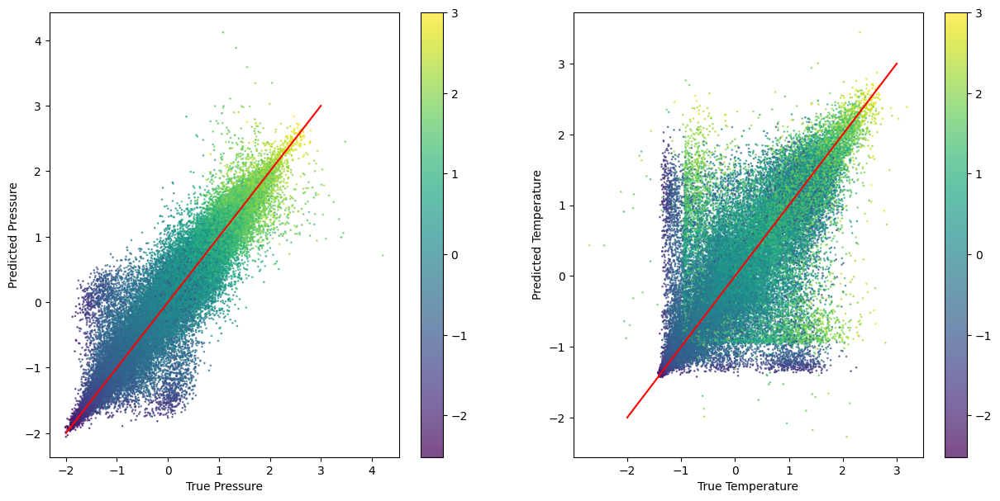

In [ ]:
figure(figsize=[15,7])
subplot(121)
scatter(y_test[:,0], pred[:,0], c=x_test[:,0], s=0.75,alpha=0.7); colorbar()
xlabel('True Pressure'); ylabel('Predicted Pressure')
plot([-2,3],[-2,3],color='r')
subplot(122)
scatter(y_test[:,1], pred[:,1], c=x_test[:,0], s=0.75,alpha=0.7); colorbar()
xlabel('True Temperature'); ylabel('Predicted Temperature')
plot([-2,3],[-2,3],color='r')

(-2.5, 3.0)

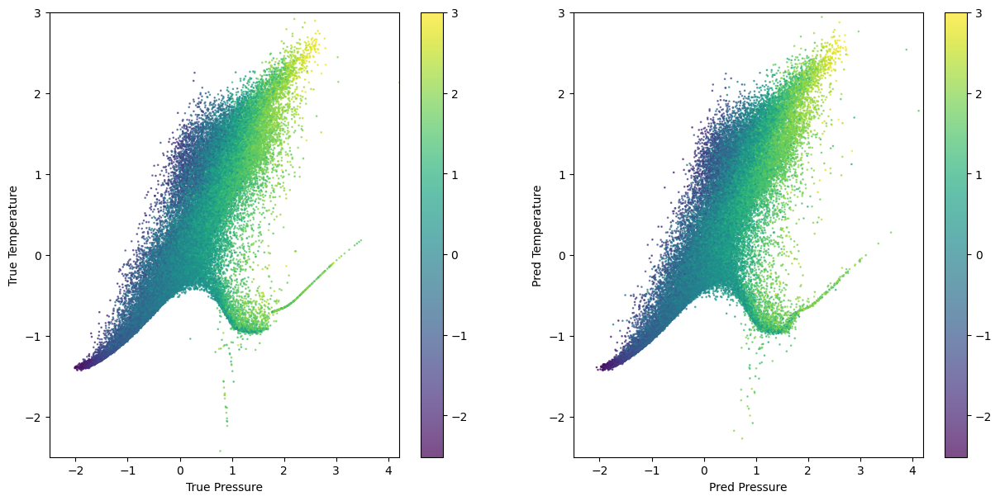

In [ ]:
figure(figsize=[15,7])
subplot(121)
scatter(y_test[:,0], y_test[:,1], c=x_test[:,0], s=0.75,alpha=0.7); colorbar()
# scatter(pred[:,0], pred[:,1], c='red', s=0.75,alpha=0.7);
xlabel('True Pressure'); ylabel('True Temperature')
xlim(-2.5, 4.2)
ylim(-2.5, 3)
subplot(122)
scatter(pred[:,0], pred[:,1], c=x_test[:,0], s=0.75,alpha=0.7); colorbar()
xlabel('Pred Pressure'); ylabel('Pred Temperature')
xlim(-2.5, 4.2)
ylim(-2.5, 3)

In [ ]:
# So, what happens if we try to make maps from this relation instead of the true one
preds = []
key = jax.random.PRNGKey(0)
for i in tqdm.tqdm(range(len(data)//50000)):
  preds.append(sampler.apply(params,seed, 50000, data[i*50000:(i+1)*50000,0:2]))
  key, seed = jax.random.split(key)
preds.append(sampler.apply(params,seed, len(data) - (i+1)*50000, data[(i+1)*50000:,0:2]))
preds = jnp.concatenate(preds, axis=0)

100%|██████████| 319/319 [01:21<00:00,  3.94it/s]


In [ ]:
# Inverting the normalisation
preds = output_scaler.inverse_transform(preds)

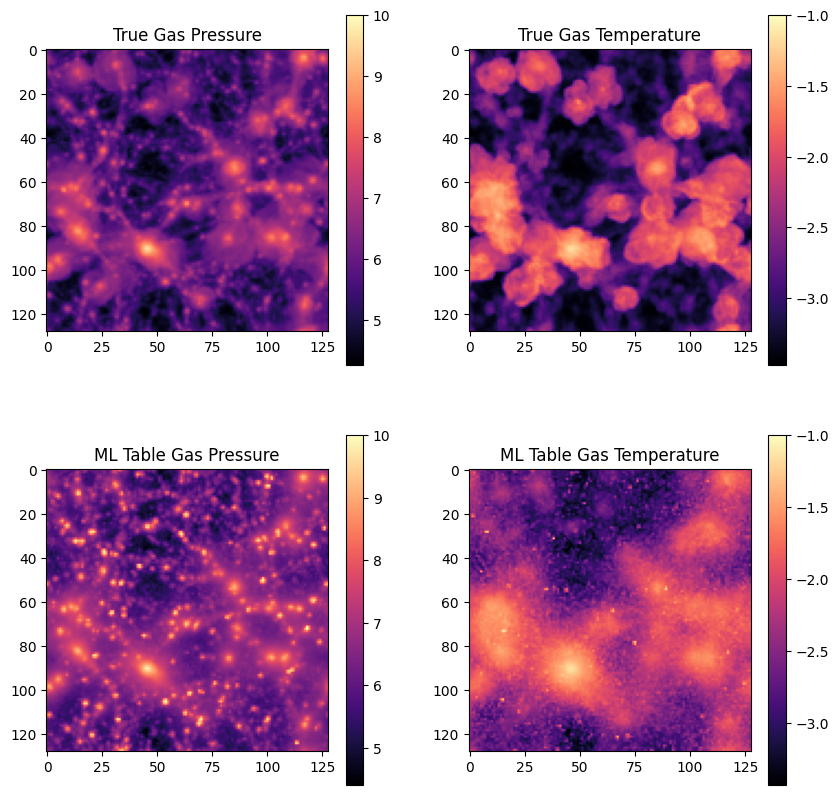

In [ ]:
figure(figsize=[10,10])
subplot(221)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_P/hydro_gas_rho).sum(axis=0)), cmap='magma',vmax=10); colorbar()
title('True Gas Pressure');
subplot(222)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_T/hydro_gas_rho).sum(axis=0)), cmap='magma',vmax=-1); colorbar()
title('True Gas Temperature');
subplot(223)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, 10**np.clip(preds[:,0],10,22)/hydro_gas_rho).sum(axis=0)), cmap='magma',vmax=10); colorbar()
title('ML Table Gas Pressure');
subplot(224)
imshow(log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, 10**np.clip(preds[:,1],0,8)/hydro_gas_rho).sum(axis=0)), cmap='magma',vmax=-1); colorbar()
title('ML Table Gas Temperature');

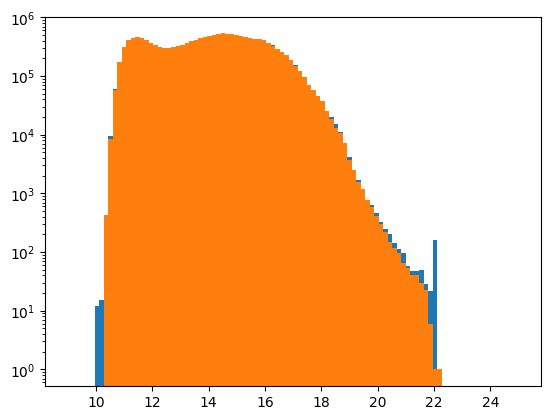

In [ ]:
hist(clip(preds[:,0],10,22), 100, range=[9,25]);
hist(data_scaler.inverse_transform(data)[:,2], 100, range=[9,25])
yscale('log')

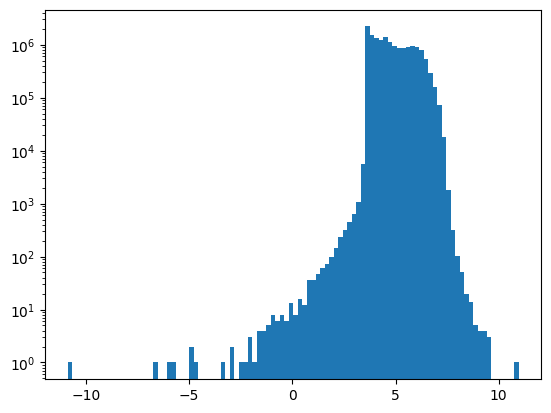

In [ ]:
hist(preds[:,1],100);
yscale('log')

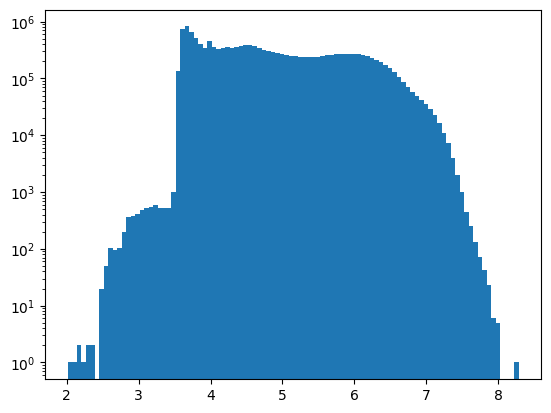

In [ ]:
hist(data_scaler.inverse_transform(data)[:,3], 100);
yscale('log')